In [1]:
import numpy as np
from PIL import Image
from scipy import ndimage

In [2]:
!cp /Users/yvanscher/Downloads/tobias-1 .
!cp /Users/yvanscher/Downloads/tobias-2 .

In [3]:
t1 = np.array(Image.open('tobias-1'))
t2 = np.array(Image.open('tobias-2'))
t1.shape, t2.shape

((4672, 3104, 3), (4672, 3104, 3))

In [4]:
teh = t2

In [5]:
# DE SCHAAP
shap = (teh.shape[0] - teh.shape[1])
exp_left = np.expand_dims(teh[:,0],1)
exp_right = np.expand_dims(teh[:,-1],1)
rep_left = np.repeat(exp_left, shap//2, axis=1)
rep_right = np.repeat(exp_right, shap//2, axis=1)
rep_left.shape, rep_right.shape

((4672, 784, 3), (4672, 784, 3))

In [7]:
# blur sides
final_img = np.concatenate([rep_left, teh, rep_right], axis=1)
# get all y coords, and 0to784+15 on the left
# ges all y coords and the origianl position 
final_img[:,:rep_left.shape[1]+15] = ndimage.filters.uniform_filter(final_img[:,:rep_left.shape[1]+15], size=(25,25,3), mode='nearest')
final_img[:,-(rep_right.shape[1]+15):] = ndimage.filters.uniform_filter(final_img[:,-(rep_right.shape[1]+15):], size=(25,25,3), mode='nearest')
blurred = Image.fromarray(final_img)

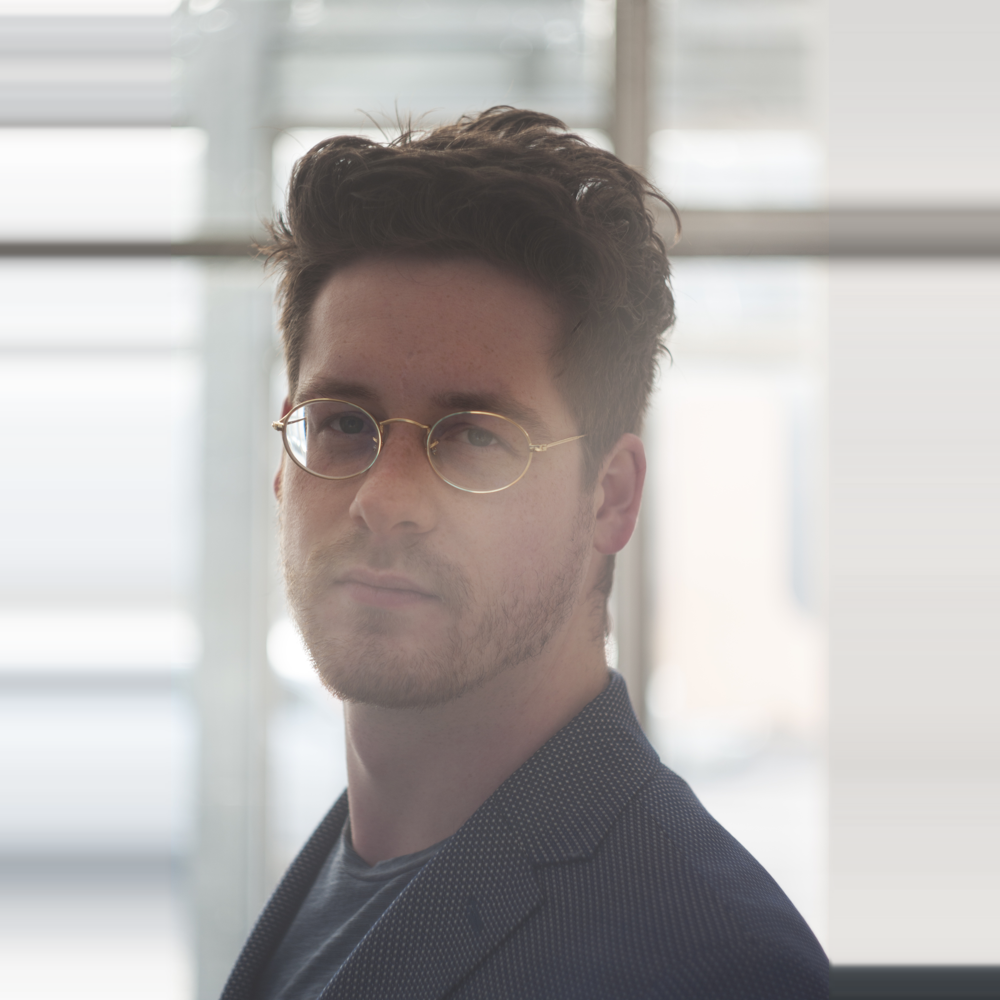

In [8]:
blurred

Read about uniform filter:

https://docs.scipy.org/doc/scipy-0.15.1/reference/generated/scipy.ndimage.filters.uniform_filter.html